In [10]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        os.path.join(dirname, filename)

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Create Dataset Loader

## Custom Dataset Loader

In [11]:
from torch.utils.data import Dataset
from PIL import Image

class CustomImageDataset(Dataset):
    def __init__(self, file_paths, labels, transform=None):
        self.file_paths = file_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.file_paths)

    def __getitem__(self, idx):
        img = Image.open(self.file_paths[idx]).convert("RGB")
        label = self.labels[idx]
        if self.transform:
            img = self.transform(img)
        return img, label


## Transformations

In [12]:
import torchvision.transforms as T
transform = T.Compose([T.Resize(64),
                     T.ToTensor(),
                     T.Normalize([0.5,0.5,0.5],
                                  [0.5,0.5,0.5]),
                     ])

## Dataset Loader

In [13]:
# import libraries
import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F

# for importing data
import torchvision
import torchvision.transforms as T
from torch.utils.data import DataLoader,Subset

import sys

import matplotlib.pyplot as plt
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

batch_size = 128

import os

# Get all image file paths from the directory
image_folder = '/kaggle/input/anime-faces/data'
file_paths = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.png')]

# Create dummy labels 
labels = [1] * len(file_paths) 

# Create Object
true_data = CustomImageDataset(file_paths=file_paths, labels=labels, transform=transform)

# Create Loader
true_data_loader = DataLoader(true_data, batch_size=batch_size, shuffle=True ,drop_last = True)

## Visualize Input

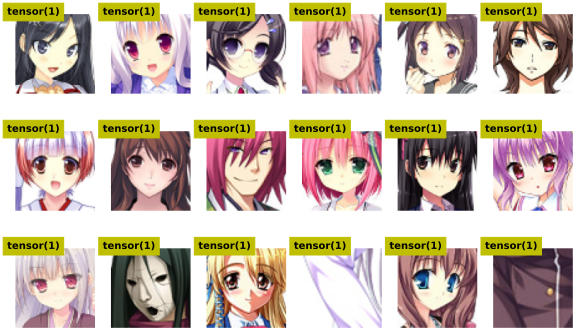

In [14]:
X,y = next(iter(true_data_loader))
fig,axs = plt.subplots(3,6,figsize=(10,6))
for (i,ax) in enumerate(axs.flatten()):
    img = X[i] 
    # Un-normalize 
    img = img / 2 + 0.5
    label = y[i]
    # show the data
    ax.imshow(img.permute(1, 2, 0).numpy())
    ax.text(14,0,label,ha='center',fontweight='bold',color='k',backgroundcolor='y')
    ax.axis('off')
plt.savefig('old_faces.png')


# Create Model

## Discriminator Class

In [15]:
class discriminatorNet(nn.Module):
  def __init__(self):
    super().__init__()

    # convolution layers
    self.conv1 = nn.Conv2d(  3, 64, 4, 2, 1, bias=False)
    self.conv2 = nn.Conv2d( 64,128, 4, 2, 1, bias=False)
    self.conv3 = nn.Conv2d(128,256, 4, 2, 1, bias=False)
    self.conv4 = nn.Conv2d(256,512, 4, 2, 1, bias=False)
    self.conv5 = nn.Conv2d(512,  1, 4, 1, 0, bias=False)

    # batchnorm
    self.bn2 = nn.BatchNorm2d(128)
    self.bn3 = nn.BatchNorm2d(256)
    self.bn4 = nn.BatchNorm2d(512)
    
  def forward(self,x):
    x = F.leaky_relu( self.conv1(x) ,.2)
    x = F.leaky_relu( self.conv2(x) ,.2)
    x = self.bn2(x)
    x = F.leaky_relu( self.conv3(x) ,.2)
    x = self.bn3(x)
    x = F.leaky_relu( self.conv4(x) ,.2)
    x = self.bn4(x)
    return torch.sigmoid( self.conv5(x) ).view(-1,1)


dnet = discriminatorNet()
y = dnet(torch.randn(10,3,64,64))
y.shape

torch.Size([10, 1])

## Generator Class

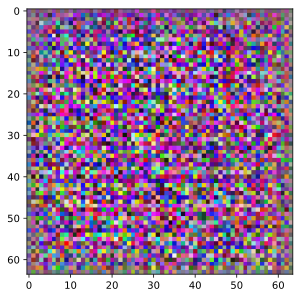

In [16]:
class generatorNet(nn.Module):
  def __init__(self):
    super().__init__()

    # convolution layers
    self.conv1 = nn.ConvTranspose2d(100,512, 4, 1, 0, bias=False)
    self.conv2 = nn.ConvTranspose2d(512,256, 4, 2, 1, bias=False)
    self.conv3 = nn.ConvTranspose2d(256,128, 4, 2, 1, bias=False)
    self.conv4 = nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False)
    self.conv5 = nn.ConvTranspose2d(64,   3, 4, 2, 1, bias=False)

    # batchnorm
    self.bn1 = nn.BatchNorm2d(512)
    self.bn2 = nn.BatchNorm2d(256)
    self.bn3 = nn.BatchNorm2d(128)
    self.bn4 = nn.BatchNorm2d( 64)


  def forward(self,x):
    x = F.relu( self.bn1(self.conv1(x)) )
    x = F.relu( self.bn2(self.conv2(x)) )
    x = F.relu( self.bn3(self.conv3(x)) )
    x = F.relu( self.bn4(self.conv4(x)) )
    x = torch.tanh( self.conv5(x) )
    return x
    

gnet = generatorNet()
y = gnet(torch.randn(10,100,1,1))
img = y[0].permute(1,2,0).detach().numpy()
img = img/2 + 0.5
plt.imshow(img)


# Training

## Metaparameters

In [17]:
lossfun = nn.BCELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
dnet = discriminatorNet().to(device)
gnet = generatorNet().to(device)

d_optimizer = torch.optim.Adam(dnet.parameters(), lr=.0002, betas=(.5,.999))
g_optimizer = torch.optim.Adam(gnet.parameters(), lr=.0002, betas=(.5,.999))

## Training Loop

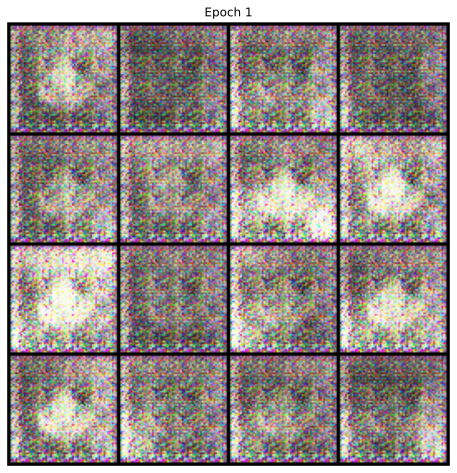

Finished epoch 9/100

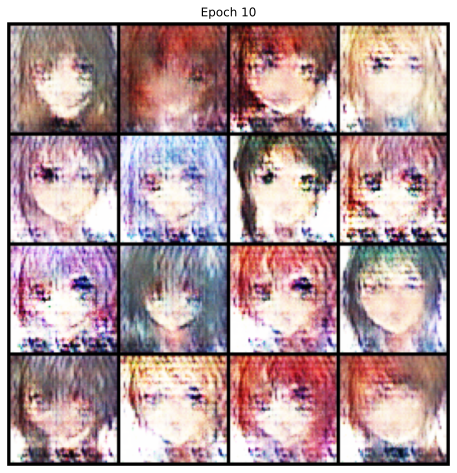

Finished epoch 19/100

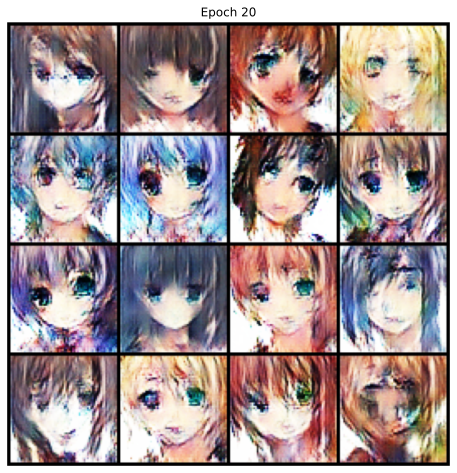

Finished epoch 29/100

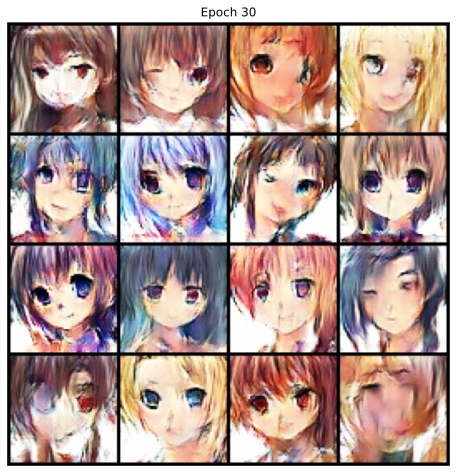

Finished epoch 39/100

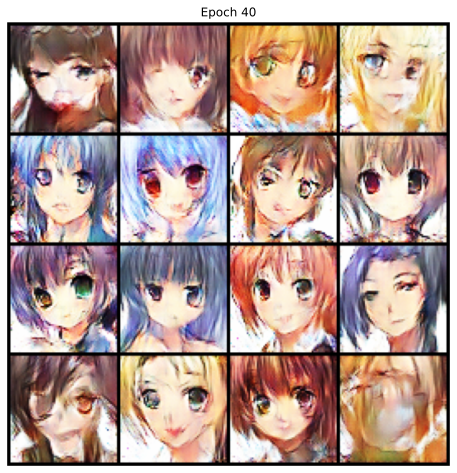

Finished epoch 49/100

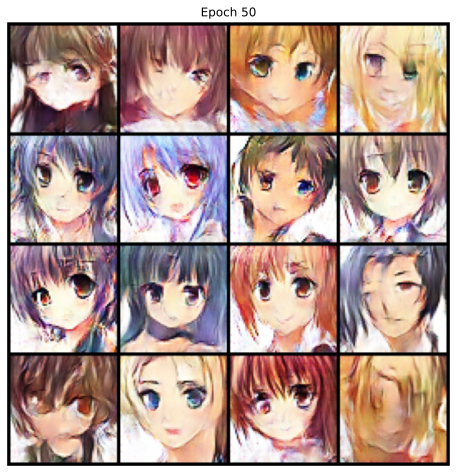

Finished epoch 59/100

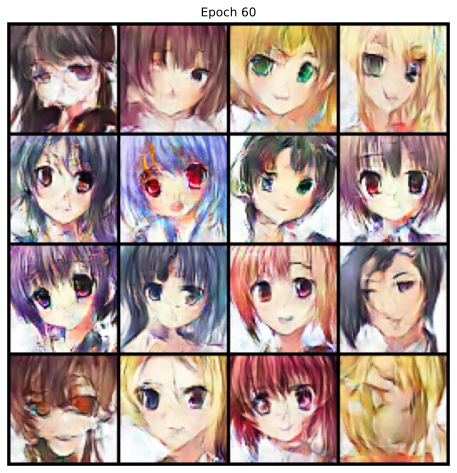

Finished epoch 69/100

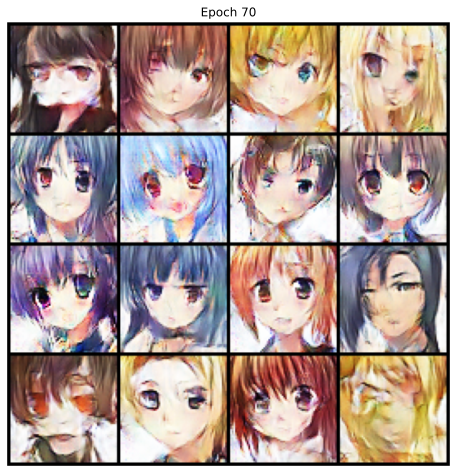

Finished epoch 79/100

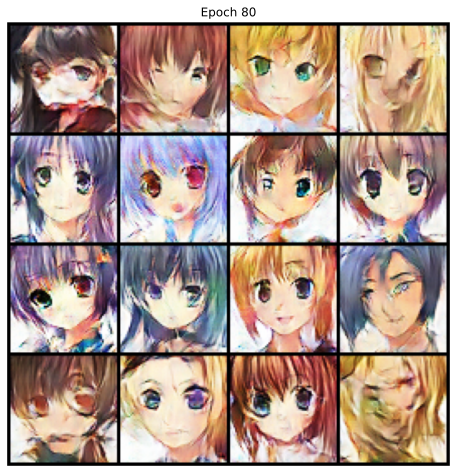

Finished epoch 89/100

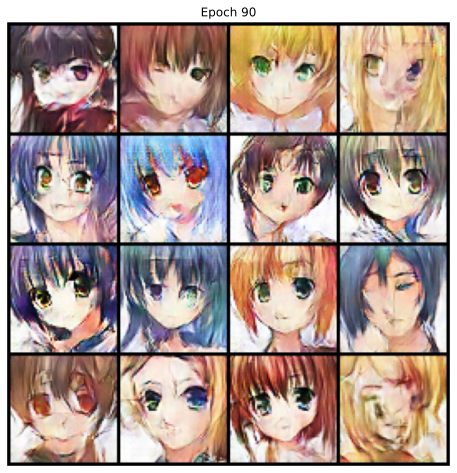

Finished epoch 99/100

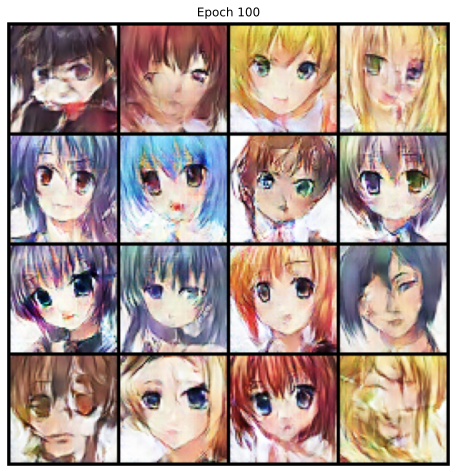

Finished epoch 100/100

In [18]:
import torchvision.utils as vutils
import os

# 1. Setup: Create a directory for results
output_dir = '/kaggle/working/gan_results'
os.makedirs(output_dir, exist_ok=True)

# 2. Setup: Fixed noise to track progress (e.g., a grid of 16 images)
fixed_noise = torch.randn(16, 100, 1, 1).to(device)

# number of epochs (expressed in number of batches)
# num_epochs = int(4000/len(true_data_loader))
num_epochs = 100
losses  = []
disDecs = []



for epochi in range(num_epochs):

  for data,_ in true_data_loader:
    
    # send data to GPU
    data = data.to(device)

    # create labels for real and fake images
    real_labels = torch.full((batch_size,1),0.8,device = device)
    fake_labels = torch.full((batch_size,1),0.2,device = device)



    ### ---------------- Train the discriminator ---------------- ###

    # forward pass and loss for REAL pictures
    pred_real   = dnet(data)                     # output of discriminator
    d_loss_real = lossfun(pred_real,real_labels) # all labels are 1

    # forward pass and loss for FAKE pictures
    fake_data   = torch.randn(batch_size,100,1,1).to(device) # random numbers to seed the generator
    fake_images = gnet(fake_data)                           # output of generator
    pred_fake   = dnet(fake_images)                         # pass through discriminator
    d_loss_fake = lossfun(pred_fake,fake_labels)            # all labels are 0

    # collect loss (using combined losses)
    d_loss = d_loss_real + d_loss_fake

    # backprop
    d_optimizer.zero_grad()
    d_loss.backward()
    d_optimizer.step()



    ### ---------------- Train the generator ---------------- ###

    # create fake images and compute loss
    fake_images = gnet(torch.randn(batch_size,100,1,1).to(device))
    pred_fake   = dnet(fake_images)

    # compute loss
    g_loss = lossfun(pred_fake,real_labels)

    # backprop
    g_optimizer.zero_grad()
    g_loss.backward()
    g_optimizer.step()


    # collect losses and discriminator decisions
    losses.append([d_loss.item(),g_loss.item()])
    
    d1 = torch.mean((pred_real>.5).float()).detach().cpu().item()
    d2 = torch.mean((pred_fake>.5).float()).detach().cpu().item()
    disDecs.append([d1,d2])
  if (epochi+1) % 10 == 0 or epochi == 0: 
    gnet.eval() # Set to evaluation mode
    with torch.no_grad():
    # Generate images using the fixed noise
      fake_samples = gnet(fixed_noise).cpu()
    # Un-normalize from [-1, 1] to [0, 1] for visualization
      fake_samples = fake_samples / 2 + 0.5
        
        # Create a grid and save
      plt.figure(figsize=(8, 8))
      grid = vutils.make_grid(fake_samples, nrow=4, padding=2)
      plt.imshow(grid.permute(1, 2, 0))
      plt.axis('off')
      plt.title(f'Epoch {epochi+1}')
        
        # Save to Kaggle /working directory
      plt.savefig(os.path.join(output_dir, f'epoch_{epochi+1}.png'))
      plt.show() # Display in notebook
      plt.close() # Close to save memory
        
    gnet.train() # Set back to training mode
  msg = f'Finished epoch {epochi+1}/{num_epochs}'
  sys.stdout.write('\r' + msg)


# convert performance from list to numpy array
losses  = np.array(losses)
disDecs = np.array(disDecs)

# Result

## Loss Visualization

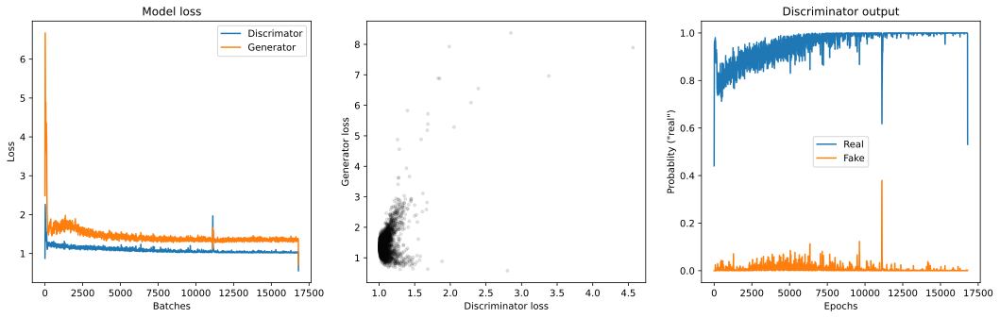

In [19]:
# create a 1D smoothing filter
def smooth(x,k=15):
  return np.convolve(x,np.ones(k)/k,mode='same')
fig,ax = plt.subplots(1,3,figsize=(18,5))

ax[0].plot(smooth(losses[:,0]))
ax[0].plot(smooth(losses[:,1]))
ax[0].set_xlabel('Batches')
ax[0].set_ylabel('Loss')
ax[0].set_title('Model loss')
ax[0].legend(['Discrimator','Generator'])


ax[1].plot(losses[::5,0],losses[::5,1],'k.',alpha=.1)
ax[1].set_xlabel('Discriminator loss')
ax[1].set_ylabel('Generator loss')

ax[2].plot(smooth(disDecs[:,0]))
ax[2].plot(smooth(disDecs[:,1]))
ax[2].set_xlabel('Epochs')
ax[2].set_ylabel('Probablity ("real")')
ax[2].set_title('Discriminator output')
ax[2].legend(['Real','Fake'])
plt.savefig('loss_result.png')
plt.show()

## New Images

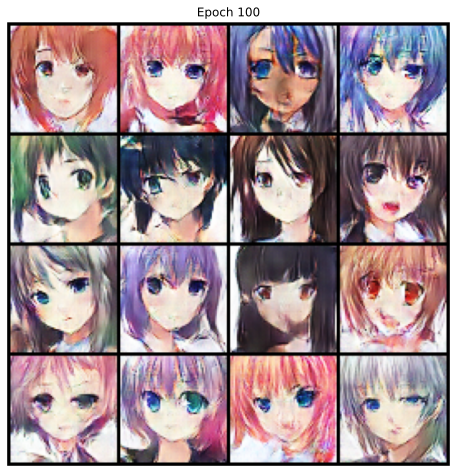

In [22]:
gnet.eval() # Set to evaluation mode
with torch.no_grad():
    fixed_noise = torch.randn(16, 100, 1, 1).to(device)
    # Generate images using the fixed noise
    fake_samples = gnet(fixed_noise).cpu()
    # Un-normalize from [-1, 1] to [0, 1] for visualization
    fake_samples = fake_samples / 2 + 0.5
        
        # Create a grid and save
    plt.figure(figsize=(8, 8))
    grid = vutils.make_grid(fake_samples, nrow=4, padding=2)
    plt.imshow(grid.permute(1, 2, 0))
    plt.axis('off')
    plt.title(f'Epoch {epochi+1}')
        
        # Save to Kaggle /working directory
    plt.savefig(os.path.join(output_dir, f'epoch_{epochi+1}.png'))
    plt.show() # Display in notebook
    plt.close() # Close to save memory